<a href="https://colab.research.google.com/github/SondipPoulSingh/Deep-Learning/blob/main/More_On_Perceptron.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from sklearn.datasets import make_classification

In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.datasets.make_classification.html
X, y = make_classification(n_samples=100, n_features=2,
                           n_informative=1, n_redundant=0,
                           n_classes=2, n_clusters_per_class=1,
                           random_state=69,hypercube=False, class_sep=10)

In [ ]:
X[0:5],y[0:5],len(X)

(array([[ 3.41355562, -0.44357374],
        [-0.90307051, -1.88006492],
        [-1.82378303, -0.14233049],
        [ 3.36343504, -0.52467429],
        [ 4.14202106, -2.46774187]]), array([1, 0, 0, 1, 1]), 100)

In [ ]:
import matplotlib.pyplot as plt

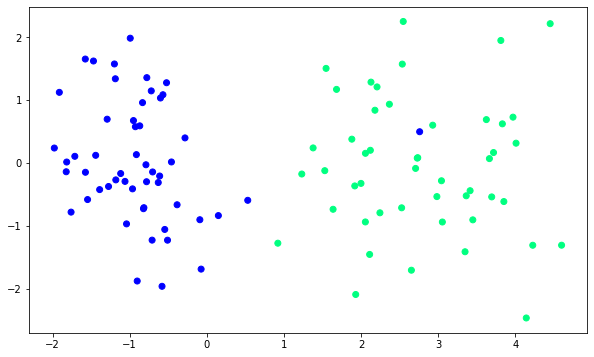

In [ ]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0],X[:,1],c=y, cmap='winter')
# https://matplotlib.org/stable/tutorials/colors/colormaps.html

In [ ]:
import numpy as np

In [ ]:
# np.insert(X,0,1,axis=1)[0:5]
X= np.insert(X,0,1,axis=1)
X[0:5]

array([[ 1.        ,  3.41355562, -0.44357374],
       [ 1.        , -0.90307051, -1.88006492],
       [ 1.        , -1.82378303, -0.14233049],
       [ 1.        ,  3.36343504, -0.52467429],
       [ 1.        ,  4.14202106, -2.46774187]])

In [ ]:
X.shape,np.ones(5)

((100, 3), array([1., 1., 1., 1., 1.]))

In [ ]:
w = np.ones(X.shape[1])
w,X[0]

(array([1., 1., 1.]), array([ 1.        ,  3.41355562, -0.44357374]))

In [ ]:
np.dot(X[0],w)

3.9699818863041005

In [ ]:
## perceptron main code
def perceptron(X,y):
     X=np.insert(X,0,1,axis=1)
     w=np.ones(X.shape[1])
     lr=0.1
     for i in range(1000):
       sample = np.random.randint(0,100)
       pred = step(np.dot(X[sample],w))
       w = w + lr*(y[sample]-pred)*X[sample]
     return w[0],w[1:]


In [ ]:
def step(value):
  return 1 if value>0 else 0

In [ ]:
bias, weights = perceptron(X,y)
bias,weights

(-0.19999999999999993, array([-0.2       ,  0.52921803, -0.03995931]))

In [ ]:
# to draw the line find m and b y=mx+b
# generate it from Ax+By+C=0 
# m = -(A/B) and b = -(C/B)
m = -(weights[0]/weights[1])
b = -(bias/weights[1])


In [ ]:
x = np.linspace(-3,3,100)
x

array([-3.        , -2.93939394, -2.87878788, -2.81818182, -2.75757576,
       -2.6969697 , -2.63636364, -2.57575758, -2.51515152, -2.45454545,
       -2.39393939, -2.33333333, -2.27272727, -2.21212121, -2.15151515,
       -2.09090909, -2.03030303, -1.96969697, -1.90909091, -1.84848485,
       -1.78787879, -1.72727273, -1.66666667, -1.60606061, -1.54545455,
       -1.48484848, -1.42424242, -1.36363636, -1.3030303 , -1.24242424,
       -1.18181818, -1.12121212, -1.06060606, -1.        , -0.93939394,
       -0.87878788, -0.81818182, -0.75757576, -0.6969697 , -0.63636364,
       -0.57575758, -0.51515152, -0.45454545, -0.39393939, -0.33333333,
       -0.27272727, -0.21212121, -0.15151515, -0.09090909, -0.03030303,
        0.03030303,  0.09090909,  0.15151515,  0.21212121,  0.27272727,
        0.33333333,  0.39393939,  0.45454545,  0.51515152,  0.57575758,
        0.63636364,  0.6969697 ,  0.75757576,  0.81818182,  0.87878788,
        0.93939394,  1.        ,  1.06060606,  1.12121212,  1.18

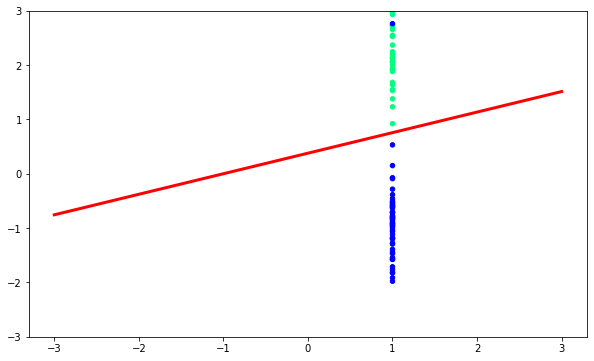

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(x,m*x+b,color='red',linewidth=3)
plt.scatter(X[:,0], X[:,1],c=y, cmap='winter',s=20)
plt.ylim(-3,3)
plt.show()

### Animation

In [ ]:
## perceptron main code
def perceptron(X,y):
     X=np.insert(X,0,1,axis=1)
     w=np.ones(X.shape[1])
     lr=0.1
     m = []
     b = []
     for i in range(1000):
       sample = np.random.randint(0,100)
       pred = step(np.dot(X[sample],w))
       w = w + lr*(y[sample]-pred)*X[sample]
       m.append(-(w[1]/w[2]))
       b.append(-(w[0]/w[2]))
     return m,b

In [ ]:
m,b = perceptron(X,y)

In [ ]:
from matplotlib.animation import FuncAnimation

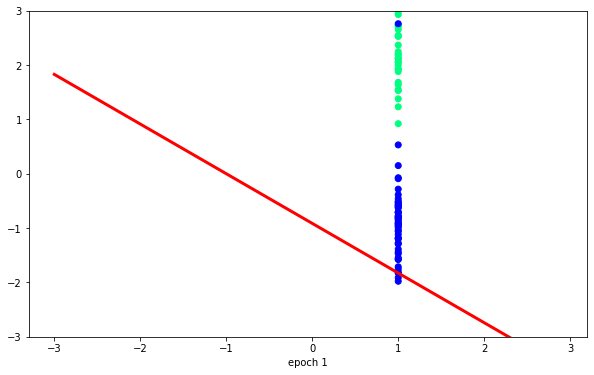

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
x = np.arange(-3,3,0.1) # https://stackoverflow.com/questions/62106028/what-is-the-difference-between-np-linspace-and-np-arange
y_line = x*m[0]+b[0]
ax.scatter(X[:,0],X[:,1], c=y, cmap='winter')
line, = ax.plot(x,y_line,'r-', linewidth=3)
plt.ylim(-3,3)

def update(i):
  label = 'epoch {0}'.format(i+1)
  line.set_ydata(x*m[i]+b[i])
  ax.set_xlabel(label)

anim = FuncAnimation(fig, update,repeat = True, frames=500, interval=100)

In [ ]:
from matplotlib import rc # https://stackoverflow.com/questions/61103994/embedding-matplotlib-animations-in-python-google-colab-notebook
rc('animation', html='jshtml')
anim

In [ ]:
## solving gates by perceptron

In [ ]:
data = {
    "input1" : [0,0,1,1],
    "input2" : [0,1,0,1],
    "andgate" : [0,0,0,1]
}


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
df = pd.DataFrame(data)
df

,input1,input2,andgate
0,0,0,0
1,0,1,0
2,1,0,0
3,1,1,1


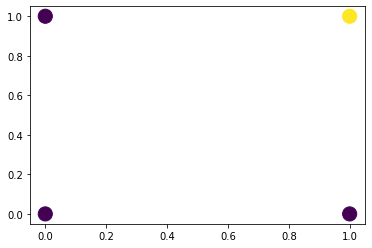

In [ ]:
plt.scatter(x=df['input1'], y=df['input2'],c=df['andgate'],s=200)
plt.show()

In [ ]:
X = np.array([[0,0],[0,1],[1,0],[1,1]])
#y = [0,0,0,1] # AND
y =np.array([0,1,1,1]) # OR


In [ ]:
def perceptron(X,y):
  lr = 0.1
  X = np.insert(X,0,1,axis=1)
  w = np.ones(X.shape[1])
  
  for i in range(100):
    sample = np.random.randint(4)
    y_hat = step(np.dot(X[sample],w))
    w = w + lr*(y[sample]-y_hat)*X[sample]
    
  return w

In [ ]:
X[0]
np.ones(X.shape[1])

array([1., 1.])

In [ ]:
def step(value):
  return 1 if value>=0 else 0

In [ ]:
w = perceptron(X,y)
w

array([-0.1,  1. ,  1. ])

In [ ]:
bias = w[0] # C
w1 = w[1] # A
w2 = w[2] # B

In [ ]:
m = -(w1/w2)
b = -(bias/w2)

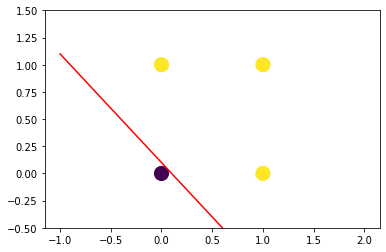

In [ ]:
x_line = np.linspace(-1,2,10)
y_line = m*x_line+b
plt.scatter(x=df['input1'], y=df['input2'],c=y,s=200)
plt.plot(x_line,y_line,color='red')
plt.ylim(-0.5,1.5)
plt.show()

In [ ]:
## sometimes perceptron dont work well due to its random selection
## or for having no calculation of loss.
## Scikit learn uses hinge loss to calculate standard line.
## A perceptron is a linear regression with Hinge Loss as loss function.

In [ ]:
from sklearn.linear_model import Perceptron

In [ ]:
X = [[0,0],[0,1],[1,0],[1,1]]
y = [0,1,1,1] # OR gate

In [ ]:
pc = Perceptron()

In [ ]:
pc.fit(X,y)

Perceptron()

In [ ]:
w = pc.coef_
bias = pc.intercept_
print(w,bias)

[[2. 2.]] [-1.]


In [ ]:
mp = -(w[0][0]/w[0][1])
bp = -(bias/w[0][1])

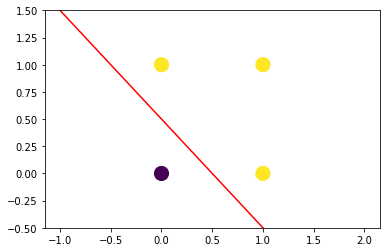

In [ ]:
x = np.linspace(-1,2,10)
plt.scatter(x=df['input1'], y=df['input2'],c=y,s=200)
plt.plot(x,mp*x+bp,color='red')
plt.ylim(-0.5,1.5)
plt.show()

In [ ]:
# what happens if we use sigmoid instead of step function

In [ ]:
X = [[0,0],[0,1],[1,0],[1,1]]
y = [0,1,1,1] # OR gate

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
log_reg= LogisticRegression(penalty='none', solver='sag')
log_reg.fit(X,y)


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,


LogisticRegression(penalty='none', solver='sag')

In [ ]:
mlr = -(log_reg.coef_[0][0]/log_reg.coef_[0][1])
blr = -(log_reg.intercept_/log_reg.coef_[0][1])

In [ ]:
def perceptron1(X,y):
  X = [[0,0],[0,1],[1,0],[1,1]]
  lr = 0.1
  X = np.insert(X,0,1,axis=1)
  w = np.ones(X.shape[1])
  
  for i in range(100):
    sample = np.random.randint(4)
    y_hat = step(np.dot(X[sample],w))
    w = w + lr*(y[sample]-y_hat)*X[sample]
  return w

def perceptron2(X,y):
  X = [[0,0],[0,1],[1,0],[1,1]]
  lr = 0.1
  X = np.insert(X,0,1,axis=1)
  w = np.ones(X.shape[1])
  
  for i in range(1000):
    sample = np.random.randint(4)
    y_hat = sigmoid(np.dot(X[sample],w))
    w = w + lr*(y[sample]-y_hat)*X[sample]
  return w

In [ ]:
def sigmoid(value):
  return 1/(1+np.exp(-value))

def step(value):
  return 1 if value>=0 else 0

In [ ]:
w = perceptron1(X,y)
wsig = perceptron2(X,y)

In [ ]:
bias = w[0] # C
w1 = w[1] # A
w2 = w[2] # B

m = -(w1/w2)
b = -(bias/w2)

bias2 = wsig[0] # C
w1s = wsig[1] # A
w2s = wsig[2] # B

ms = -(w1s/w2s)
bs = -(bias2/w2s)

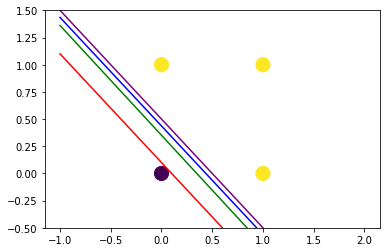

In [ ]:
x_line = np.linspace(-1,2,10)
y_line_step = m*x_line+b
y_line_sigmoid = ms*x_line+bs
y_line_perceptron = mp*x_line+bp
y_line_logreg = mlr*x_line+blr

plt.scatter(x=df['input1'], y=df['input2'],c=y,s=200)
plt.plot(x_line,y_line_step,color='red')
plt.plot(x_line,y_line_sigmoid,color='green')
plt.plot(x_line,y_line_perceptron,color='purple')
plt.plot(x_line,y_line_logreg,color='blue')
plt.ylim(-0.5,1.5)
plt.show()

In [ ]:
### Why logistic Regression not working

In [ ]:
X = [[0,0],[0,1],[1,0],[1,1]]
y = [0,1,1,1] # OR gate

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lor = LogisticRegression(penalty='none', solver='sag')

In [ ]:
lor.fit(X,y)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,


LogisticRegression(penalty='none', solver='sag')

In [ ]:
print(lor.coef_)
print(lor.intercept_)

[[7.47780123 7.47397965]]
[-3.26828935]


In [ ]:
m = -(lor.coef_[0][0]/lor.coef_[0][1])
b = -(lor.intercept_/lor.coef_[0][1])

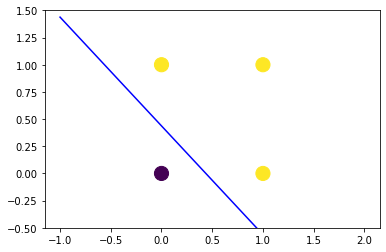

In [ ]:
x_line = np.linspace(-1,2,10)
y_line_logreg = m*x_line+b

plt.scatter(x=df['input1'], y=df['input2'],c=y,s=200)
plt.plot(x_line,y_line_logreg,color='blue')
plt.ylim(-0.5,1.5)

plt.show()

In [ ]:
# using log loss
def gd(X,y):
  lr = 0.1
  X = np.insert(X,0,1,axis=1)
  w = np.ones(X.shape[1])
  
  for i in range(10000):
    y_hat = sigmoid(np.dot(X,w))
    w = w + lr*np.dot((y-y_hat),X)/X.shape[0]
  return w

In [ ]:
X = [[0,0],[0,1],[1,0],[1,1]]
w = gd(X,y)

In [ ]:
bias = w[0] # C
w1 = w[1] # A
w2 = w[2] # B

mll = -(w1/w2)
bll = -(bias/w2)

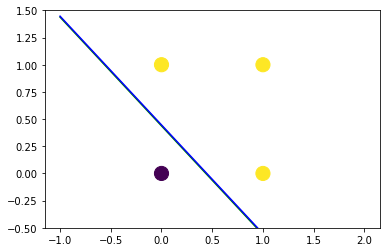

In [ ]:
x_line = np.linspace(-1,2,10)
y_line_logloss = mll*x_line+bll

plt.scatter(x=df['input1'], y=df['input2'],c=y,s=200)
plt.plot(x_line,y_line_logreg,color='green')
plt.plot(x_line,y_line_logloss,color='blue')
plt.ylim(-0.5,1.5)

plt.show()

XOR Gate

XOR = OR+NAND + AND


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
data_OR = {
    'input1':[0,0,1,1],
    'input2':[0,1,0,1],
    'output':[0,1,1,1]
}

data_NAND = {
    'input1':[0,0,1,1],
    'input2':[0,1,0,1],
    'output':[1,1,1,0]
}

data_AND = {
    'input1':[0,0,1,1],
    'input2':[0,1,0,1],
    'output':[0,0,0,1]
}


In [ ]:
df_or = pd.DataFrame(data_OR)
df_nand = pd.DataFrame(data_NAND)
df_and = pd.DataFrame(data_AND)
df_and

,input1,input2,output
0,0,0,0
1,0,1,0
2,1,0,0
3,1,1,1


In [ ]:
X_or = df_or[['input1','input2']].values
y_or = df_or['output'].values

X_nand = df_nand[['input1','input2']].values
y_nand = df_nand['output'].values

In [ ]:
def perceptron(X,y):
  X = np.insert(X,0,1,axis=1)
  lr = 0.1
  w = np.ones(X.shape[1]) # column value

  for i in range(100):
    sample = np.random.randint(4) #1
    y_hat = step(np.dot(X[sample],w)) # 1/0
    w = w + lr*(y[sample]-y_hat)*X[sample]
  return w

In [ ]:
def step(value):
  return 1 if value>=0 else 0

In [ ]:
w_or = perceptron(X_or,y_or)
w_nand = perceptron(X_nand,y_nand)
print(w_or,w_nand)

[-0.1  1.   1. ] [ 0.2 -0.2 -0.1]


(-1.0, 2.0)

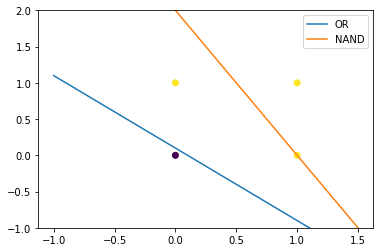

In [ ]:
mor = -(w_or[1]/w_or[2])
bor = -(w_or[0]/w_or[2])

mnand = -(w_nand[1]/w_nand[2])
bnand = -(w_nand[0]/w_nand[2])

x_line = np.linspace(-1,1.5,30)
y_line_or = mor*x_line+bor
y_line_nand = mnand*x_line+bnand
plt.scatter(df_or['input1'],df_or['input2'],c=df_or['output'])
plt.plot(x_line,y_line_or,label="OR")
plt.plot(x_line,y_line_nand,label="NAND")
plt.legend()
plt.ylim(-1,2)

In [ ]:
X = np.insert(X_or,0,1,axis=1)
print(X,w_or)
input1 = np.dot(X,w_or)
input2 = np.dot(X,w_nand)
print(input1,input2)

[[1 0 0]
 [1 0 1]
 [1 1 0]
 [1 1 1]] [-0.1  1.   1. ]
[-0.1  0.9  0.9  1.9] [ 2.00000000e-01  1.00000000e-01  2.77555756e-16 -1.00000000e-01]


In [ ]:
X_and = df_and[['input1','input2']].values
y_and = df_and['output'].values
w_and = perceptron(X_and, y_and)
w_and

array([-0.7,  0.5,  0.4])

(-1.0, 2.0)

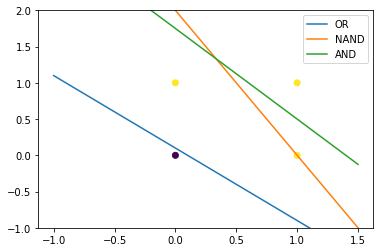

In [ ]:
mor = -(w_or[1]/w_or[2])
bor = -(w_or[0]/w_or[2])

mnand = -(w_nand[1]/w_nand[2])
bnand = -(w_nand[0]/w_nand[2])

mand = -(w_and[1]/w_and[2])
band = -(w_and[0]/w_and[2])

x_line = np.linspace(-1,1.5,30)
y_line_or = mor*x_line+bor
y_line_nand = mnand*x_line+bnand
y_line_and = mand*x_line+band

plt.scatter(df_or['input1'],df_or['input2'],c=df_or['output'])
plt.plot(x_line,y_line_or,label="OR")
plt.plot(x_line,y_line_nand,label="NAND")
plt.plot(x_line,y_line_and,label="AND")
plt.legend()
plt.ylim(-1,2)

In [ ]:
def sigmoid(value):
  return 1/(1+np.exp(-value))

In [ ]:
input1=sigmoid(input1)
input2=sigmoid(input2)
data_AND_Updated = {
    'input1':input1,
    'input2':input2,
    'output':[0,0,0,1]
}

df_and = pd.DataFrame(data_AND_Updated)
df_and

,input1,input2,output
0,0.475021,0.549834,0
1,0.710950,0.524979,0
2,0.710950,0.500000,0
3,0.869892,0.475021,1


In [ ]:
X_and = df_and[['input1','input2']].values
X_and

array([[0.47502081, 0.549834  ],
       [0.7109495 , 0.52497919],
       [0.7109495 , 0.5       ],
       [0.86989153, 0.47502081]])

In [ ]:
X=np.insert(X_and,0,1,axis=1)

In [ ]:
#w_and = perceptron(df_and[['input1','input2']].values,df_and['output'])
#output = np.dot(X,w_and)
output = np.dot(X,[-30,20,20])
final_output = sigmoid(output)
final_output

array([7.46292202e-05, 5.05944500e-03, 3.07610592e-03, 4.30349935e-02])

[0.47502081 0.7109495  0.7109495  0.86989153] [0.549834   0.52497919 0.5        0.47502081] [7.46292202e-05 5.05944500e-03 3.07610592e-03 4.30349935e-02]


Text(0.5, 0, 'z')

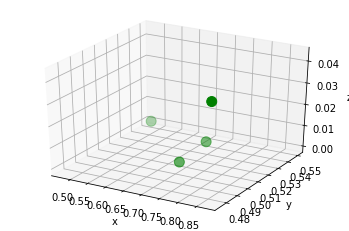

In [ ]:
print(input1,input2,final_output)
ax = plt.axes(projection='3d')
ax.scatter(input1,input2,final_output,s=100,color='green') #ax.plot3D for lines
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')
